In [14]:
from google.colab import drive
drive.mount('content')

Drive already mounted at content; to attempt to forcibly remount, call drive.mount("content", force_remount=True).


# Q1-A

In [ ]:
import cv2
img_11  = cv2.imread("/content/content/MyDrive/assignment2 - computer vision - images/1.1.jpg")

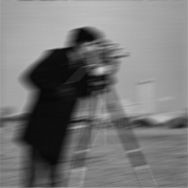

In [ ]:
from google.colab.patches import cv2_imshow
cv2_imshow(img_11)

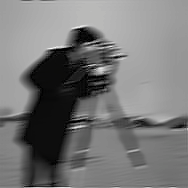

In [ ]:
import numpy as np
#first method
#sharpen
kernel_one = np.array([[0, -1, 0],
                   [-1, 5,-1],
                   [0, -1, 0]])
sharpened_img_one = cv2.filter2D(img_11, -1, kernel_one)

#denoised
denoised_img_one = cv2.fastNlMeansDenoisingColored(sharpened_img_one, None, 10, 10, 7, 21)
cv2_imshow(denoised_img_one)

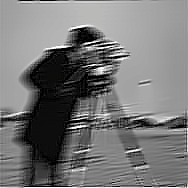

In [ ]:
#second method
#sharpen
kernel_two = np.array([[-1, -1, -1],
                   [-1, 9,-1],
                   [-1, -1, -1]])
sharpened_img_two = cv2.filter2D(img_11, -1, kernel_two)

#denoised
denoised_img_two = cv2.fastNlMeansDenoisingColored(sharpened_img_two, None, 10, 10, 7, 21)
cv2_imshow(denoised_img_two)

# Q1-B

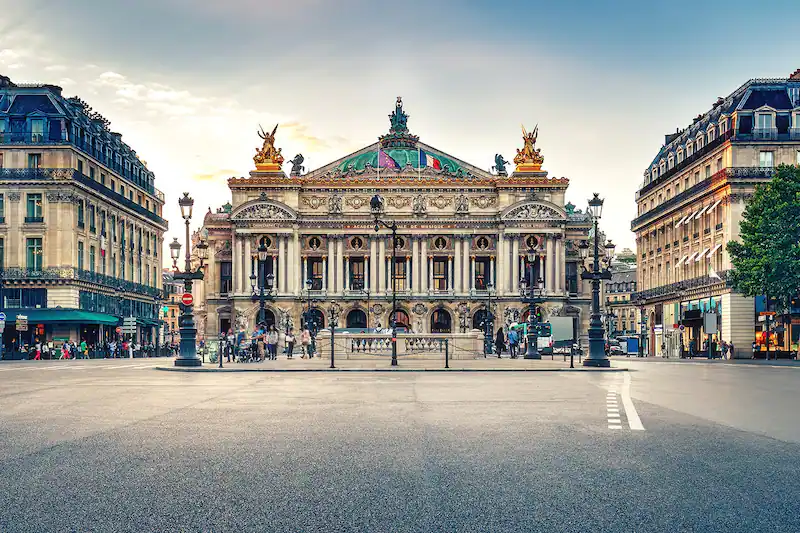

In [ ]:
img_12  = cv2.imread("/content/content/MyDrive/assignment2 - computer vision - images/1.2.jpg")
cv2_imshow(img_12)

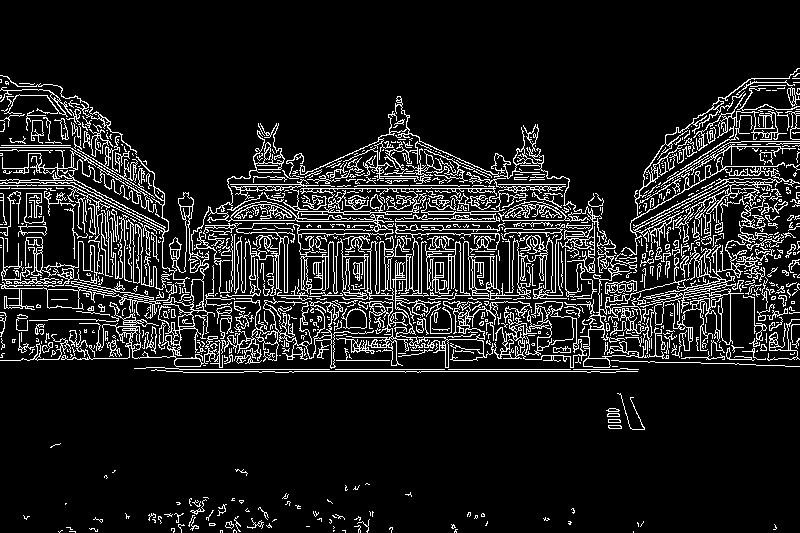

In [ ]:
#grayscale
gray_img_12 = cv2.cvtColor(img_12, cv2.COLOR_BGR2GRAY)

#blur
#Gaussian blur for reducing noise in the photo before edge detection
blurred_img_12 = cv2.GaussianBlur(gray_img_12, (3, 3), 0)

#canny
edges_img_12 = cv2.Canny(blurred_img_12, 100, 200)
cv2_imshow(edges_img_12)

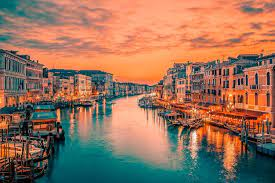

In [ ]:
img_13  = cv2.imread("/content/content/MyDrive/assignment2 - computer vision - images/1.3.jpg")
cv2_imshow(img_13)

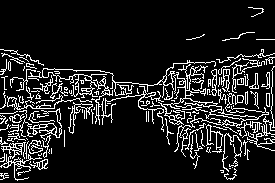

In [ ]:
#grayscale
gray_img_13 = cv2.cvtColor(img_13, cv2.COLOR_BGR2GRAY)

#blur
#Gaussian blur for reducing noise in the photo before edge detection
blurred_img_13 = cv2.GaussianBlur(gray_img_13, (3, 3), 0)

#canny
edges_img_13 = cv2.Canny(blurred_img_13, 100, 200)
cv2_imshow(edges_img_13)

# Q1-C

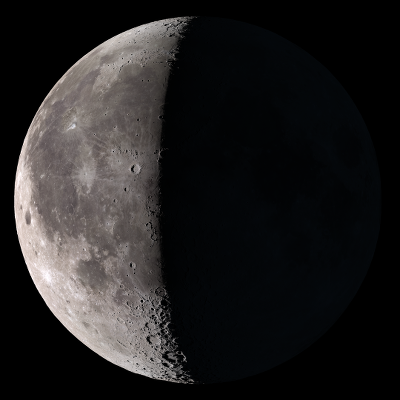

In [ ]:
img_14  = cv2.imread("/content/content/MyDrive/assignment2 - computer vision - images/1.4.jpg")
cv2_imshow(img_14)

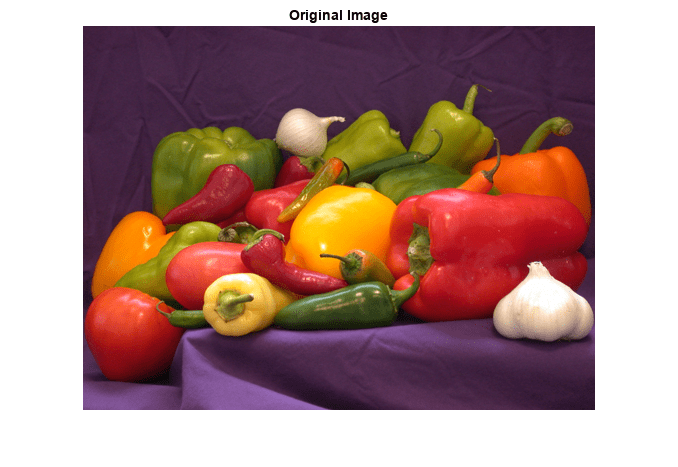

In [ ]:
img_15  = cv2.imread("/content/content/MyDrive/assignment2 - computer vision - images/1.5.jpg")
cv2_imshow(img_15)

**unsharp masking:**


Sharpens the image by enhancing edges, making details more prominent

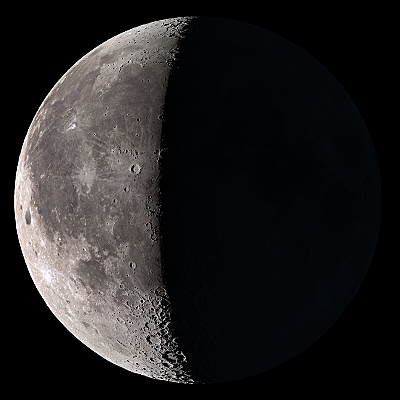

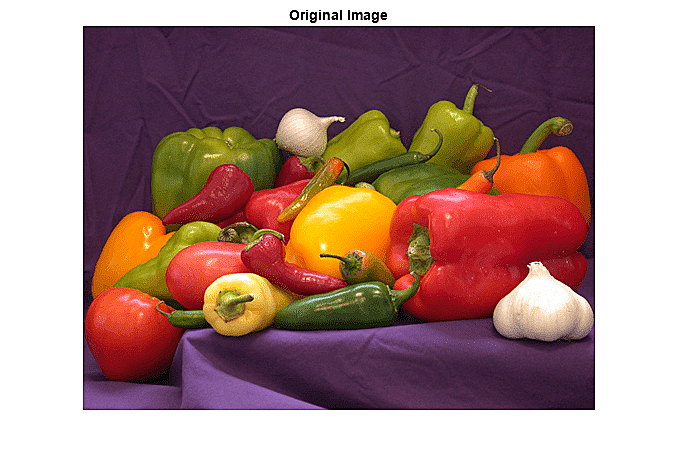

In [ ]:
#first method
#unsharp masking
def unsharp_mask(image, kernel_size=(5, 5), sigma=1.0, amount=1.5, threshold=0):
    blurred = cv2.GaussianBlur(image, kernel_size, sigma)
    sharpened = float(amount + 1) * image - float(amount) * blurred
    sharpened = np.maximum(sharpened, np.zeros(sharpened.shape))
    sharpened = np.minimum(sharpened, 255 * np.ones(sharpened.shape))
    sharpened = sharpened.round().astype(np.uint8)
    if threshold > 0:
        low_contrast_mask = np.absolute(image - blurred) < threshold
        np.copyto(sharpened, image, where=low_contrast_mask)
    return sharpened

sharp_img_14 = unsharp_mask(img_14)
sharp_img_15 = unsharp_mask(img_15)

cv2_imshow(sharp_img_14)
cv2_imshow(sharp_img_15)

**CLAHE(Contrast Limited Adaptive Histogram Equalization):**

Enhances contrast locally, reducing the risk of noise amplification in homogeneous areas.

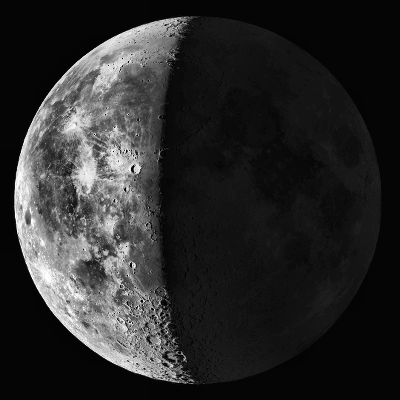

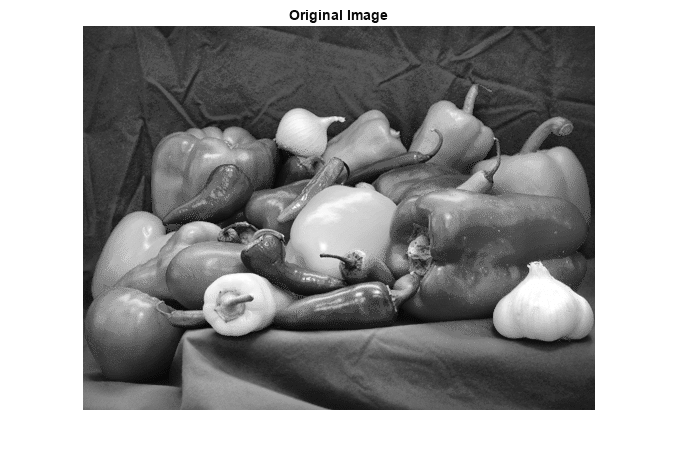

In [ ]:
#second method
#CLAHE
gray_img_14 = cv2.cvtColor(img_14, cv2.COLOR_BGR2GRAY)
gray_img_15 = cv2.cvtColor(img_15, cv2.COLOR_BGR2GRAY)

clahe = cv2.createCLAHE(clipLimit=4.0, tileGridSize=(8, 8))
clahe_img_14 = clahe.apply(gray_img_14)
clahe_img_15 = clahe.apply(gray_img_15)

cv2_imshow(clahe_img_14)
cv2_imshow(clahe_img_15)

# Q1-D

In [41]:
def auto_threshold(image, k=2):

    median = np.median(image)   #median of single-channel pixel intensities

    low_threshold = max(0, (1.0 - k / 10.0) * median)
    high_threshold = min(255, (1.0 + k / 10.0) * median)

    #Canny with computed thresholds
    edges = cv2.Canny(image, low_threshold, high_threshold)

    return edges

In [43]:
def read_and_convert_to_gray(image_path):
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Image at path {image_path} could not be read.")
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    return img

In [44]:
img_15_path = "/content/content/MyDrive/assignment2 - computer vision - images/1.2.jpg"
img_15 = read_and_convert_to_gray(img_15_path)

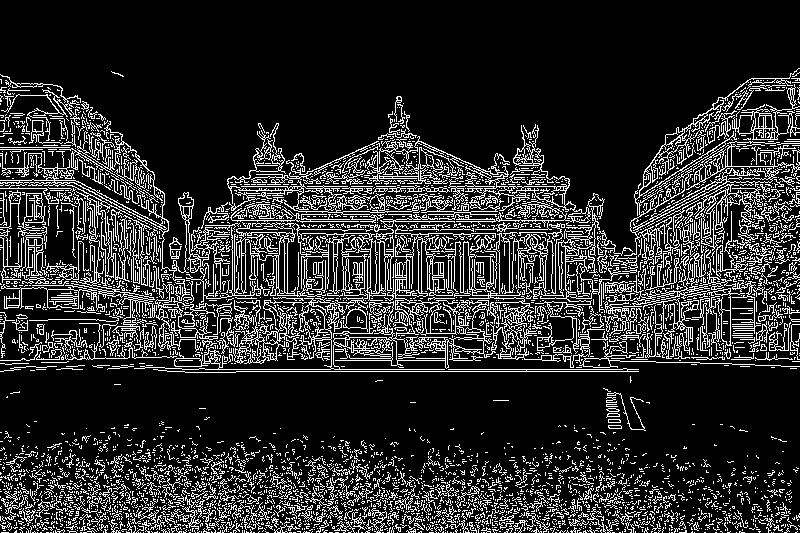

In [45]:
edges = auto_threshold(img_15)

cv2_imshow(edges)

# Q2

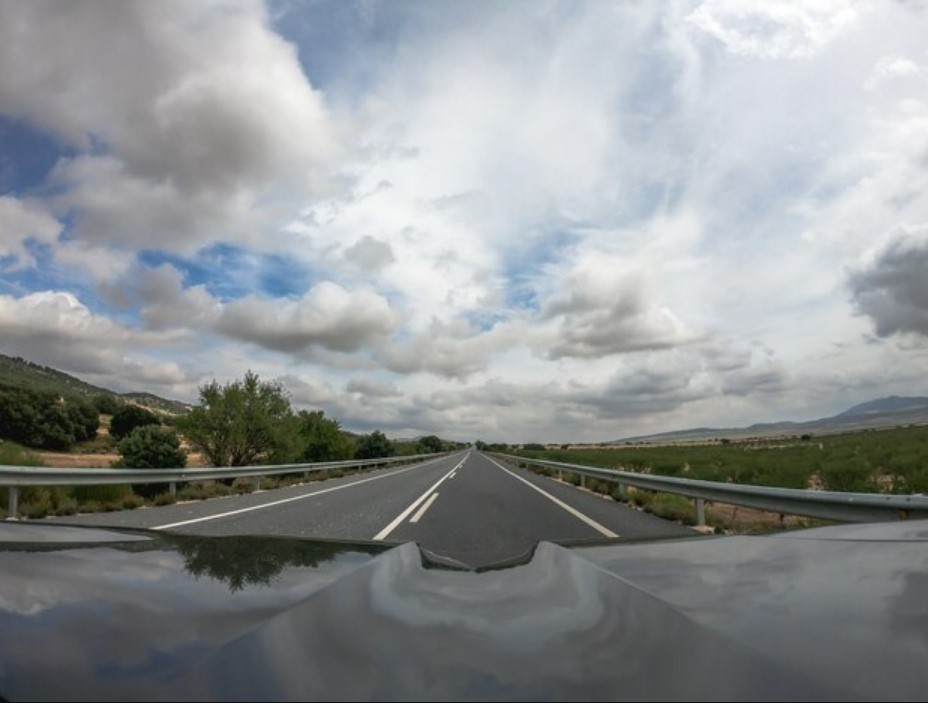

In [ ]:
img_21  = cv2.imread("/content/content/MyDrive/assignment2 - computer vision - images/input1.jpg")
cv2_imshow(img_21)

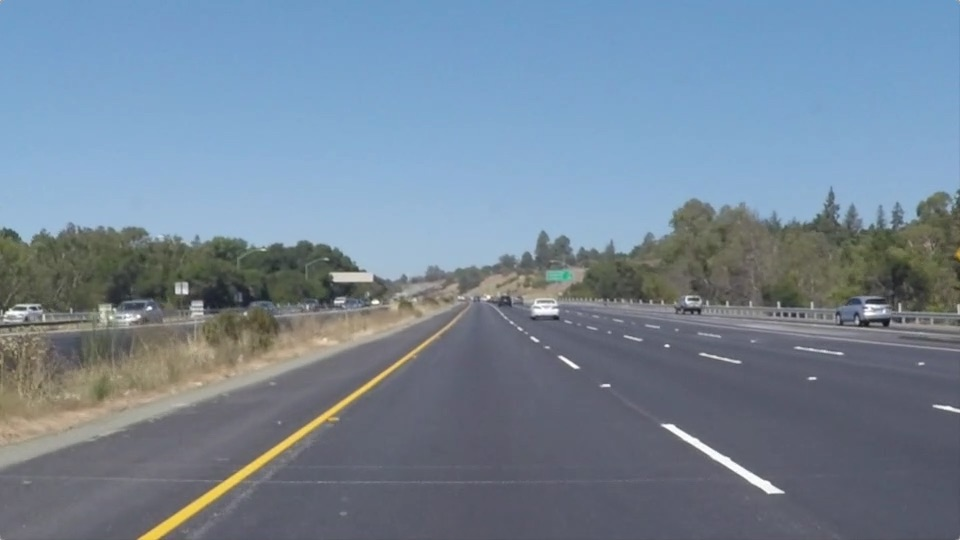

In [ ]:
img_22  = cv2.imread("/content/content/MyDrive/assignment2 - computer vision - images/input2.jpg")
cv2_imshow(img_22)

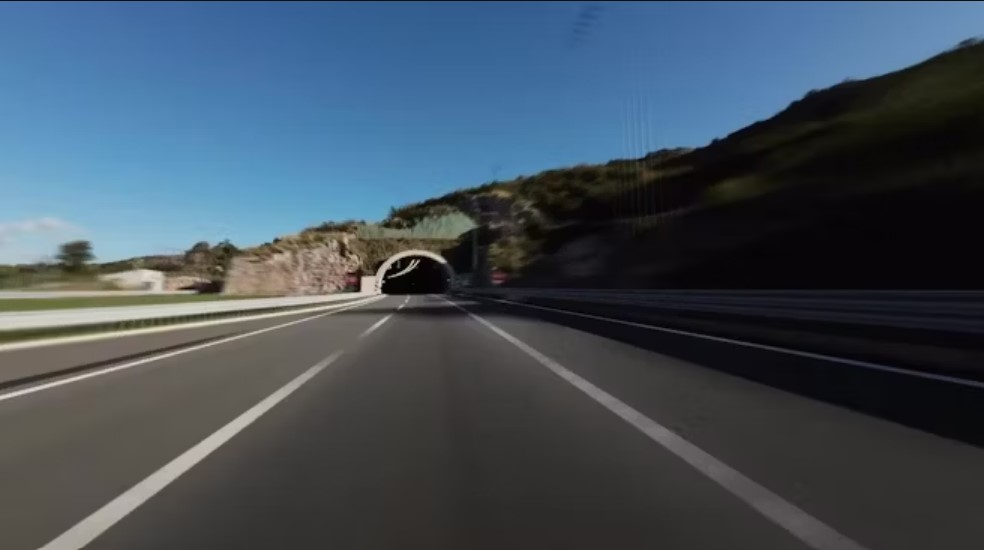

In [ ]:
img_23  = cv2.imread("/content/content/MyDrive/assignment2 - computer vision - images/input3.jpg")
cv2_imshow(img_23)

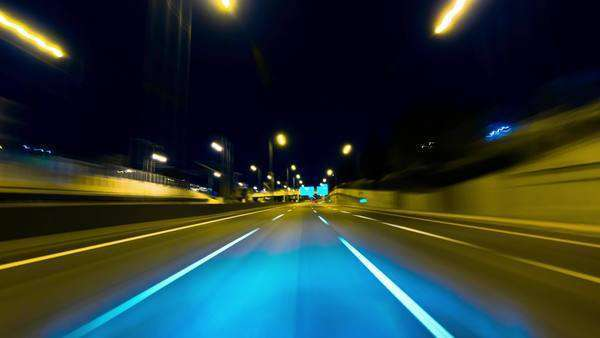

In [ ]:
img_24  = cv2.imread("/content/content/MyDrive/assignment2 - computer vision - images/input4.jpg")
cv2_imshow(img_24)

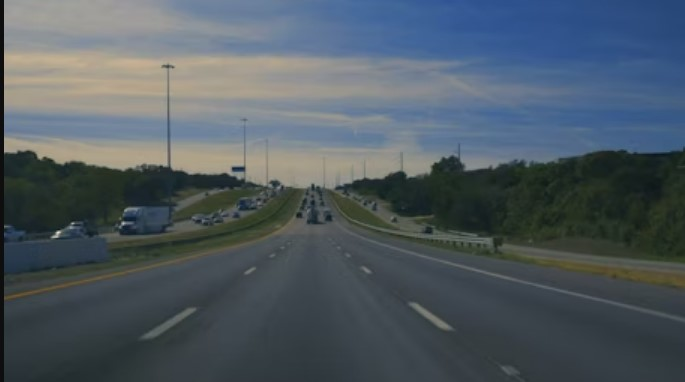

In [ ]:
img_25  = cv2.imread("/content/content/MyDrive/assignment2 - computer vision - images/input5.jpg")
cv2_imshow(img_25)

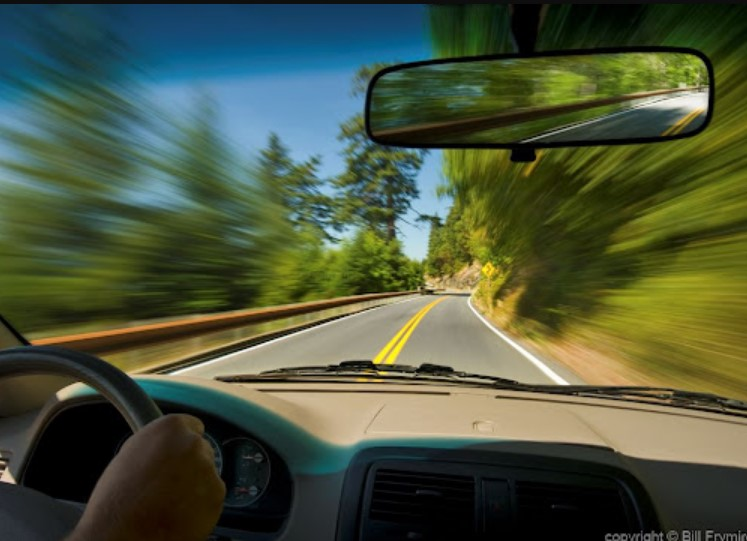

In [ ]:
img_26  = cv2.imread("/content/content/MyDrive/assignment2 - computer vision - images/input6.jpg")
cv2_imshow(img_26)

In [ ]:
#grayscale
gray_img_21 = cv2.cvtColor(img_21, cv2.COLOR_BGR2GRAY)
gray_img_22 = cv2.cvtColor(img_22, cv2.COLOR_BGR2GRAY)
gray_img_23 = cv2.cvtColor(img_23, cv2.COLOR_BGR2GRAY)
gray_img_24 = cv2.cvtColor(img_24, cv2.COLOR_BGR2GRAY)
gray_img_25 = cv2.cvtColor(img_25, cv2.COLOR_BGR2GRAY)
gray_img_26 = cv2.cvtColor(img_26, cv2.COLOR_BGR2GRAY)

In [ ]:
#Gaussian blur
blurred_img_21 = cv2.GaussianBlur(gray_img_21, (5, 5), 0)
blurred_img_22 = cv2.GaussianBlur(gray_img_22, (5, 5), 0)
blurred_img_23 = cv2.GaussianBlur(gray_img_23, (5, 5), 0)
blurred_img_24 = cv2.GaussianBlur(gray_img_24, (5, 5), 0)
blurred_img_25 = cv2.GaussianBlur(gray_img_25, (5, 5), 0)
blurred_img_26 = cv2.GaussianBlur(gray_img_26, (5, 5), 0)

In [ ]:
#Canny edge detection
edges_21 = cv2.Canny(blurred_img_21, 50, 150)
edges_22 = cv2.Canny(blurred_img_22, 50, 150)
edges_23 = cv2.Canny(blurred_img_23, 50, 150)
edges_24 = cv2.Canny(blurred_img_24, 50, 150)
edges_25 = cv2.Canny(blurred_img_25, 50, 150)
edges_26 = cv2.Canny(blurred_img_26, 50, 150)

**detecting road lines for image 2 & 3 & 4 & 5:**

In [ ]:
def region_of_interest(img):
    height, width = img.shape
    mask = np.zeros_like(img)

    #polygon
    polygon = np.array([[
        (0, height),
        (width, height),
        (width, int(height * 0.6)),
        (0, int(height * 0.6))
    ]], np.int32)

    cv2.fillPoly(mask, polygon, 255)
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

In [ ]:
#mask edges image with ROI
roi_edges_22 = region_of_interest(edges_22)
roi_edges_23 = region_of_interest(edges_23)
roi_edges_24 = region_of_interest(edges_24)
roi_edges_25 = region_of_interest(edges_25)

In [ ]:
#Hough Line Transform and draw lines
def draw_lines(image, lines):
    for line in lines:
        for x1, y1, x2, y2 in line:
            cv2.line(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
    return image

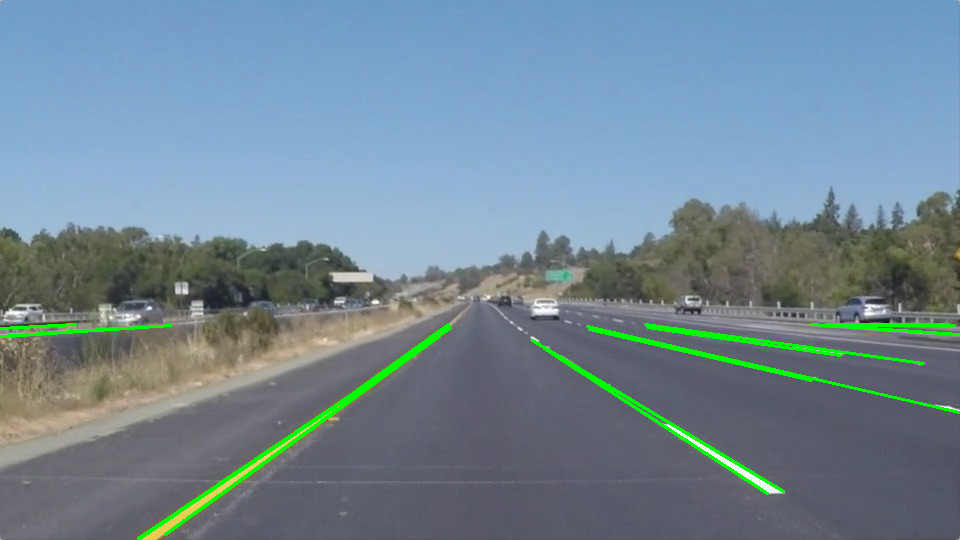

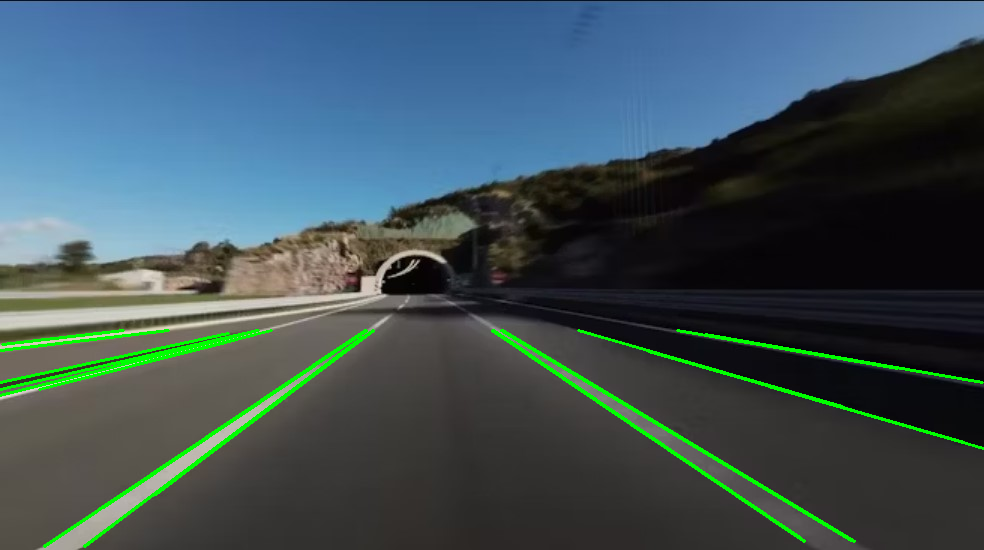

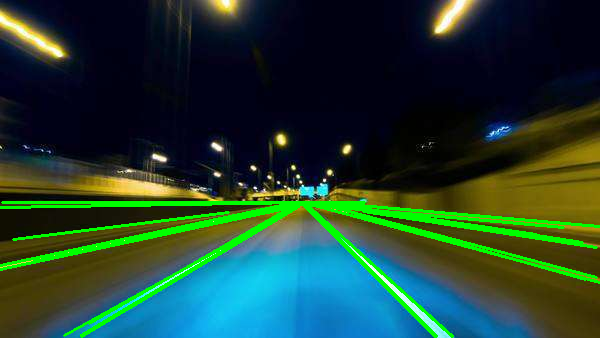

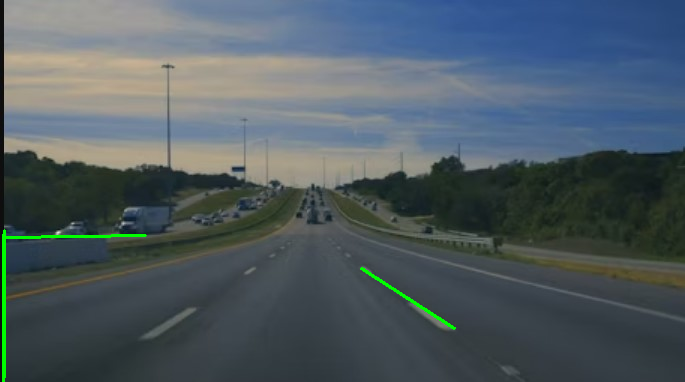

In [ ]:
lines_22 = cv2.HoughLinesP(roi_edges_22, 1, np.pi / 180, 50, minLineLength=50, maxLineGap=150)
lines_23 = cv2.HoughLinesP(roi_edges_23, 1, np.pi / 180, 50, minLineLength=50, maxLineGap=150)
lines_24 = cv2.HoughLinesP(roi_edges_24, 1, np.pi / 180, 50, minLineLength=50, maxLineGap=150)
lines_25 = cv2.HoughLinesP(roi_edges_25, 1, np.pi / 180, 50, minLineLength=50, maxLineGap=150)

img_22_lines = draw_lines(img_22.copy(), lines_22)
img_23_lines = draw_lines(img_23.copy(), lines_23)
img_24_lines = draw_lines(img_24.copy(), lines_24)
img_25_lines = draw_lines(img_25.copy(), lines_25)

cv2_imshow(img_22_lines)
cv2_imshow(img_23_lines)
cv2_imshow(img_24_lines)
cv2_imshow(img_25_lines)

**detecting road lines for image 1 & 6:**

In [ ]:
def draw_lines(image, lines):
    for line in lines:
        for x1, y1, x2, y2 in line:
            cv2.line(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
    return image

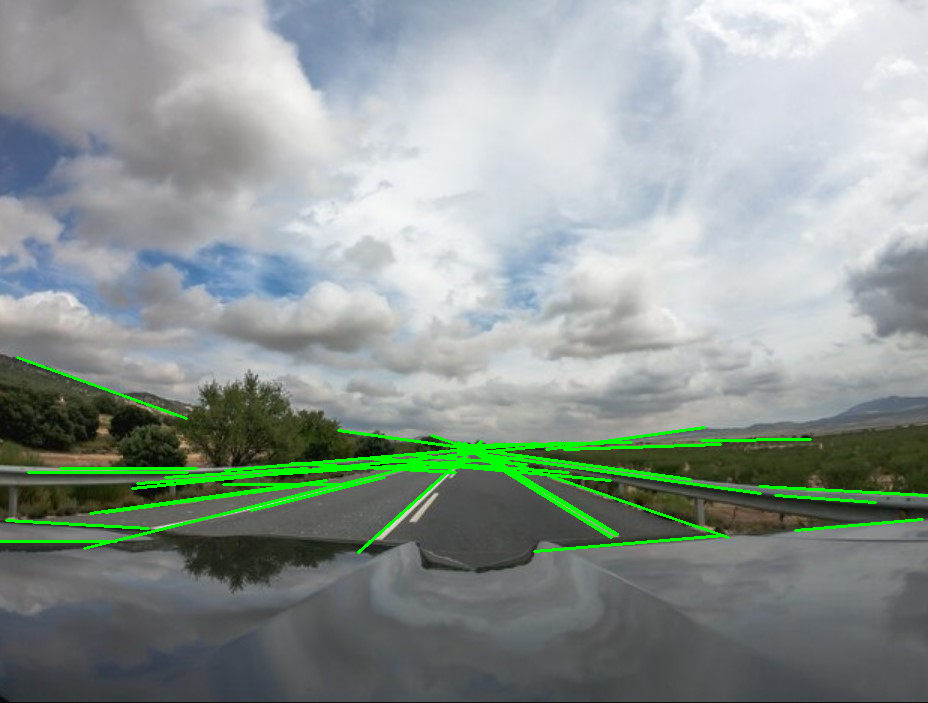

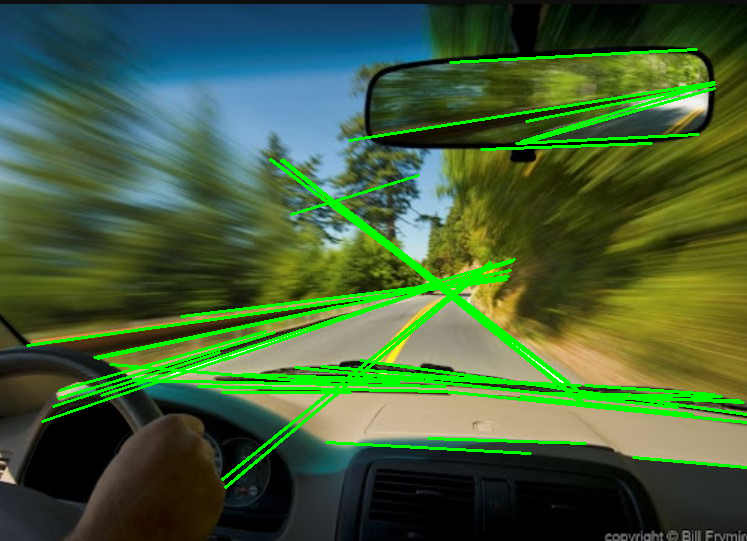

In [ ]:
lines_21 = cv2.HoughLinesP(edges_21, 1, np.pi / 180, 100, minLineLength=100, maxLineGap=50)
lines_26 = cv2.HoughLinesP(edges_26, 1, np.pi / 180, 100, minLineLength=100, maxLineGap=50)

img_21_lines = draw_lines(img_21.copy(), lines_21)
img_26_lines = draw_lines(img_26.copy(), lines_26)

cv2_imshow(img_21_lines)
cv2_imshow(img_26_lines)

# Q3

In [ ]:
def read_and_convert_to_gray(image_path):
    img = cv2.imread(image_path)
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    return img

In [ ]:
original_img_path = '/content/content/MyDrive/assignment2 - computer vision - images/3.0.png'
original_img = read_and_convert_to_gray(original_img_path)

cropped_images_paths = [
    '/content/content/MyDrive/assignment2 - computer vision - images/3.1.png',
    '/content/content/MyDrive/assignment2 - computer vision - images/3.2.png',
    '/content/content/MyDrive/assignment2 - computer vision - images/3.3.png',
    '/content/content/MyDrive/assignment2 - computer vision - images/3.4.png',
    '/content/content/MyDrive/assignment2 - computer vision - images/3.5.png',
    '/content/content/MyDrive/assignment2 - computer vision - images/3.6.png',
    '/content/content/MyDrive/assignment2 - computer vision - images/3.7.png',
    '/content/content/MyDrive/assignment2 - computer vision - images/3.8.png'
]

cropped_images = [read_and_convert_to_gray(path) for path in cropped_images_paths]

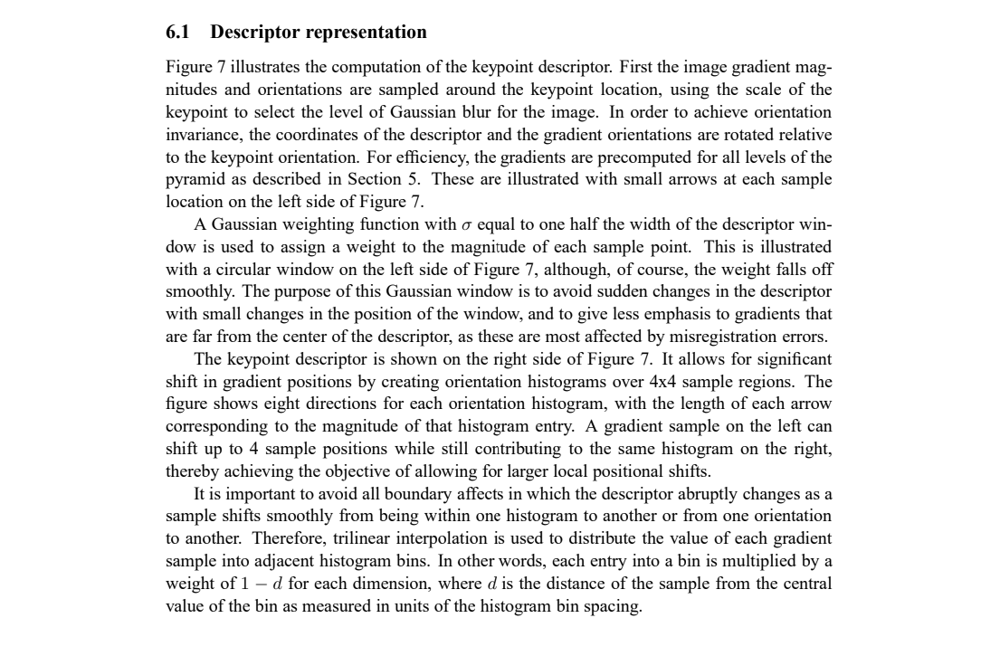

In [ ]:
cv2_imshow(original_img)

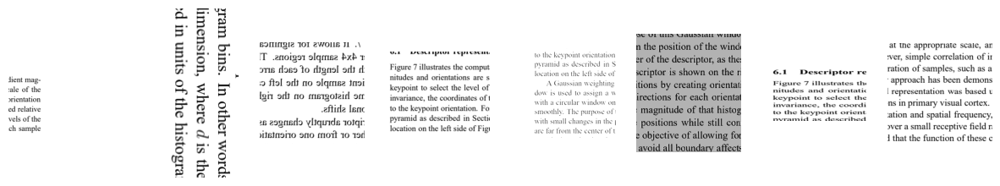

In [ ]:
import matplotlib.pyplot as plt

def show_images(images):
    fig, axs = plt.subplots(1, len(images), figsize=(15, 5))
    for i, image in enumerate(images):
        axs[i].imshow(image, cmap='gray')
        axs[i].axis('off')
    plt.show()

show_images(cropped_images)

In [ ]:
from skimage.feature import hog
from skimage import data, exposure

#SIFT detector
sift = cv2.SIFT_create()

#extracting SIFT features for the original image
kp_original, des_original = sift.detectAndCompute(original_img, None)

bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

Displaying comparison with image 1


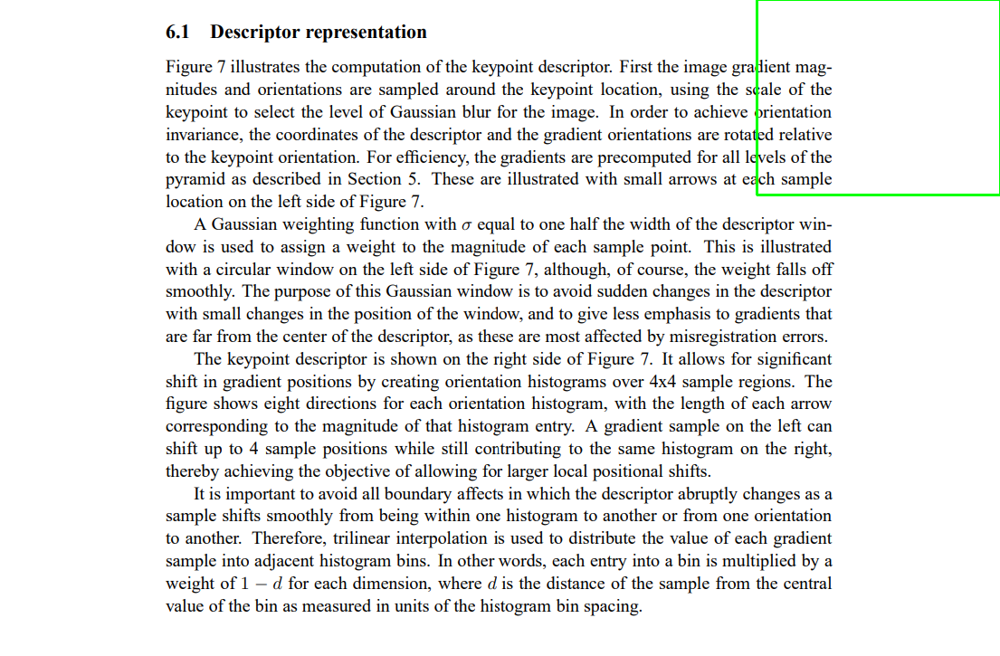

Displaying comparison with image 2


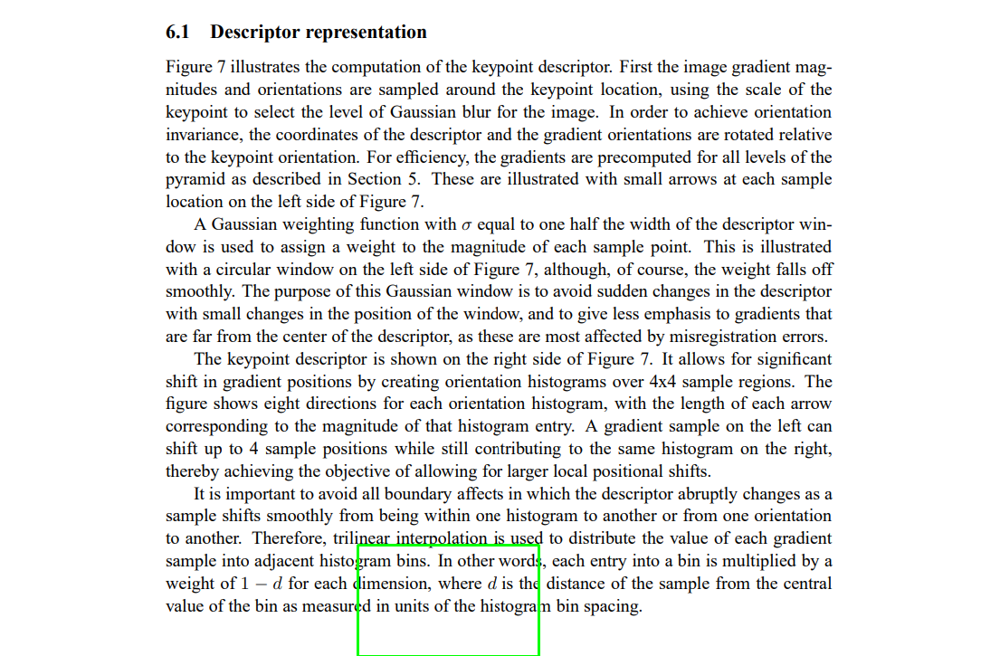

Displaying comparison with image 3


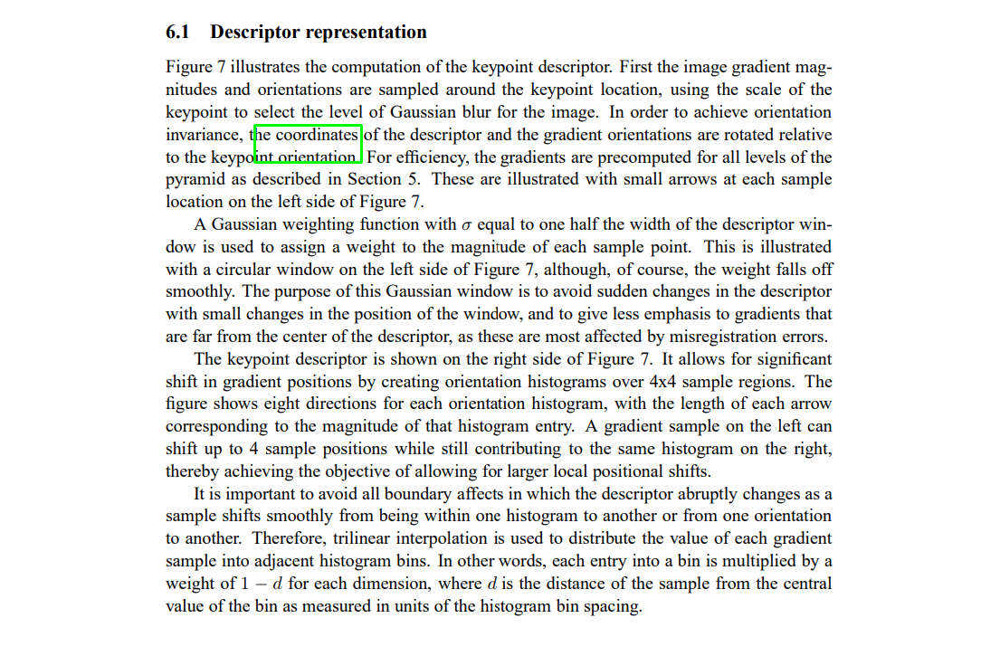

Displaying comparison with image 4


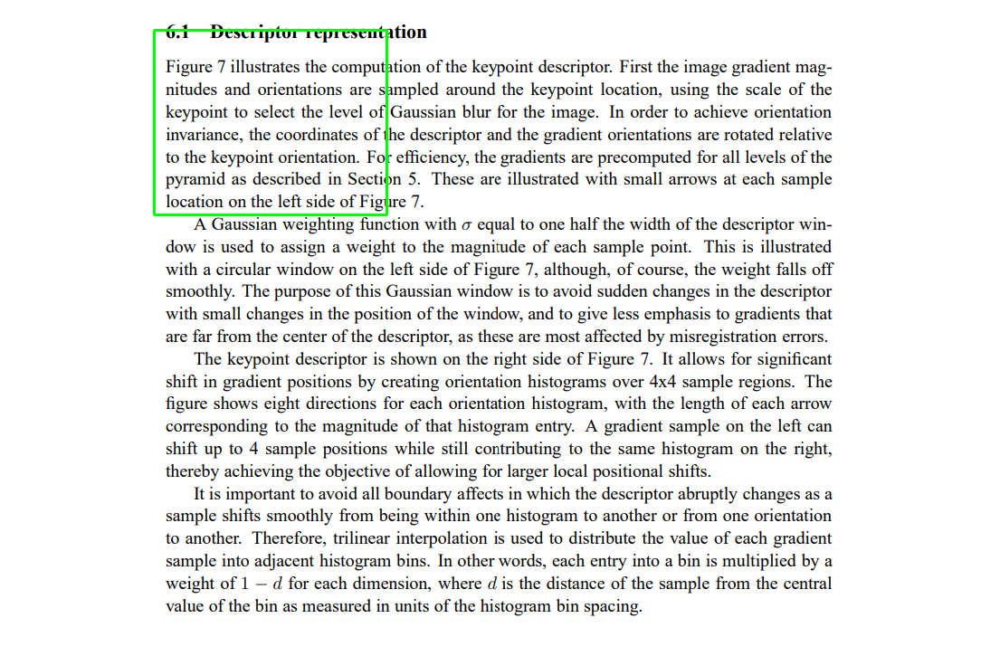

Displaying comparison with image 5


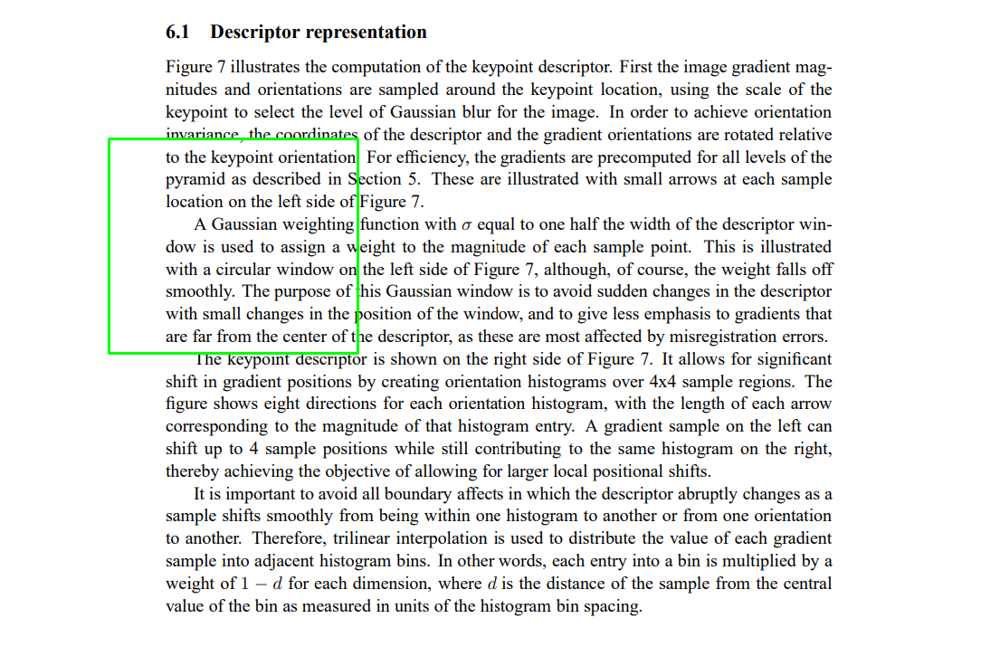

Displaying comparison with image 6


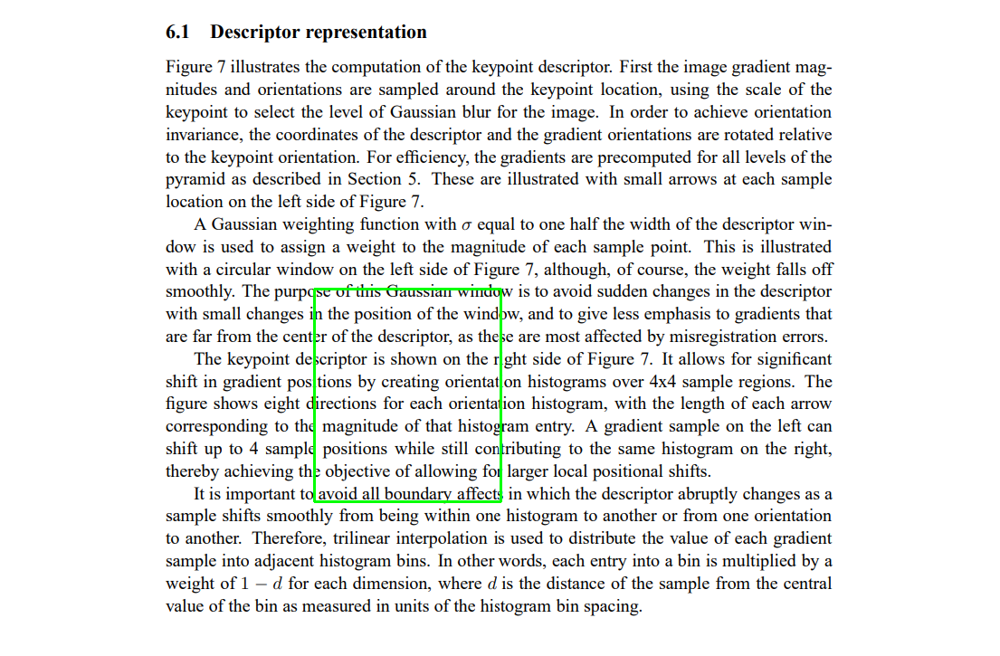

Displaying comparison with image 7


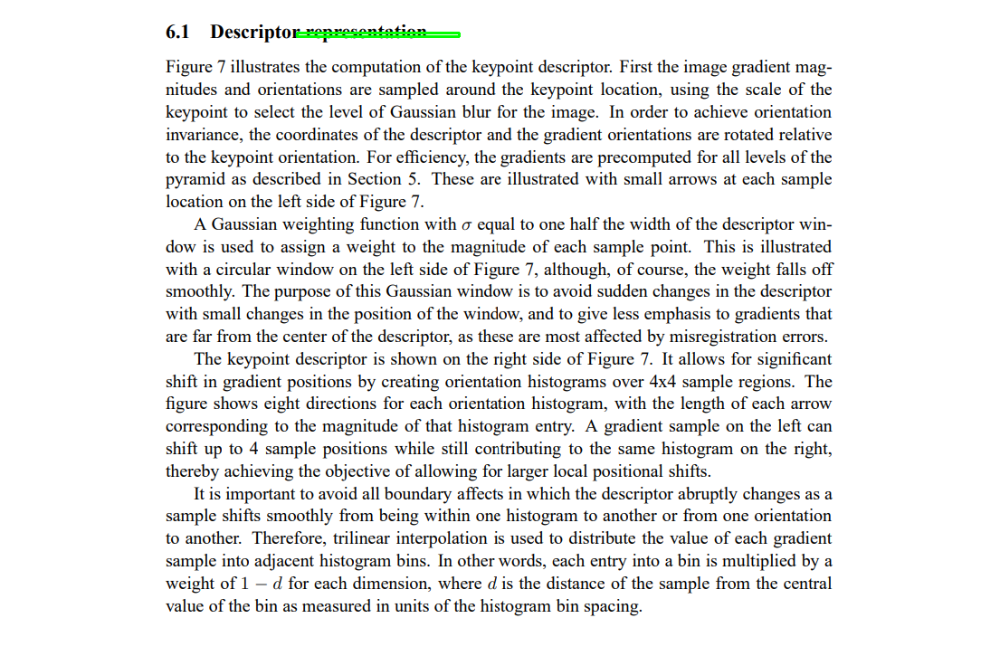

Displaying comparison with image 8


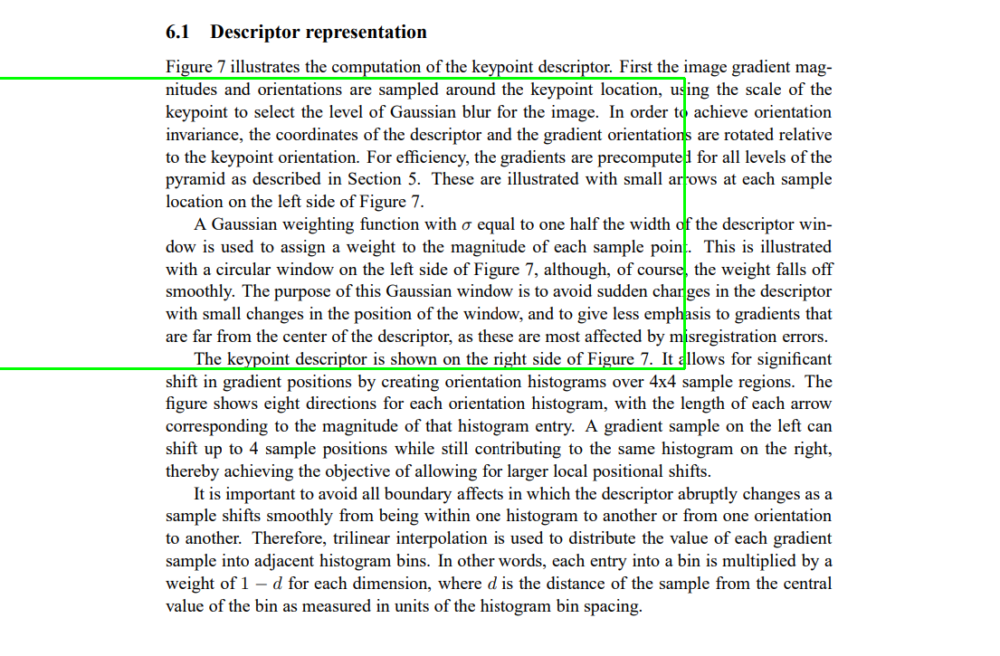

In [ ]:
#performing SIFT-based matching
for i, cropped_img in enumerate(cropped_images):

    display_img = cv2.imread(original_img_path)

    #extracting SIFT features for cropped image
    kp_cropped, des_cropped = sift.detectAndCompute(cropped_img, None)

    matches = bf.match(des_cropped, des_original)
    matches = sorted(matches, key=lambda x: x.distance)

    #extracting matched keypoints
    if len(matches) > 10:
        src_pts = np.float32([kp_cropped[m.queryIdx].pt for m in matches]).reshape(-1, 2)
        dst_pts = np.float32([kp_original[m.trainIdx].pt for m in matches]).reshape(-1, 2)

        #homography matrix
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

        #getting coordinates in the original image using homography matrix
        h, w = cropped_img.shape[:2]
        pts = np.float32([[0, 0], [0, h-1], [w-1, h-1], [w-1, 0]]).reshape(-1, 1, 2)
        dst = cv2.perspectiveTransform(pts, M)

        x, y, w, h = cv2.boundingRect(dst)

        #rectangle around similar region
        cv2.rectangle(display_img, (x, y), (x + w, y + h), (0, 255, 0), 2)


    print(f"Displaying comparison with image {i + 1}")
    cv2_imshow(display_img)

**.......................................................**

In [ ]:
cropped_images = [read_and_convert_to_gray(path) for path in cropped_images_paths]

In [ ]:
def extract_hog_features(image): #extracting HOG features from an image
    fd, hog_image = hog(image, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=True)
    hog_image = exposure.rescale_intensity(hog_image, in_range=(0, 10))
    return fd, hog_image

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

def find_best_match(org_image, template_image): #finding best match of a template in the original image
    org_h, org_w = org_image.shape[:2]
    template_h, template_w = template_image.shape[:2]
    best_score = 0
    best_position = None ##

    for y in range(0, org_h - template_h + 1, 50):
        for x in range(0, org_w - template_w + 1, 50):
            org_patch = org_image[y:y + template_h, x:x + template_w]
            org_patch_fd, _ = extract_hog_features(org_patch)

            template_fd, _ = extract_hog_features(template_image)
            sim_score = cosine_similarity(org_patch_fd.reshape(1, -1), template_fd.reshape(1, -1))[0, 0]

            if sim_score > best_score:
                best_score = sim_score
                best_position = (x, y)

    return best_score, best_position

In [ ]:
def detect_objects_hog(org_image, template_images, threshold=0.5):
    for idx, template_image in enumerate(template_images):
        _, position = find_best_match(org_image, template_image)
        if position is not None:
            x, y = position

            display_img = cv2.imread(original_img_path)
            #rectangle around similar region
            cv2.rectangle(display_img, (x, y), (x + template_image.shape[1], y + template_image.shape[0]), (0, 255, 0), 2) ##

            plt.imshow(cv2.cvtColor(display_img, cv2.COLOR_BGR2RGB))
            plt.axis('off')
            plt.title(f'comparison with image {idx + 1}')
            plt.show()

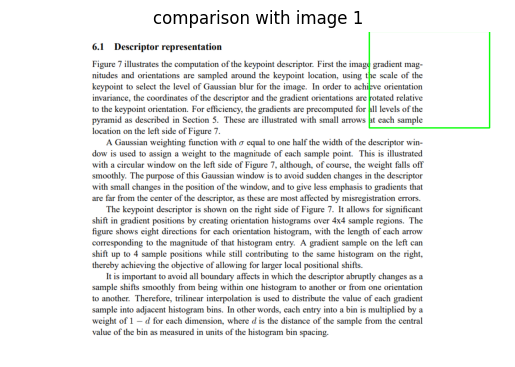

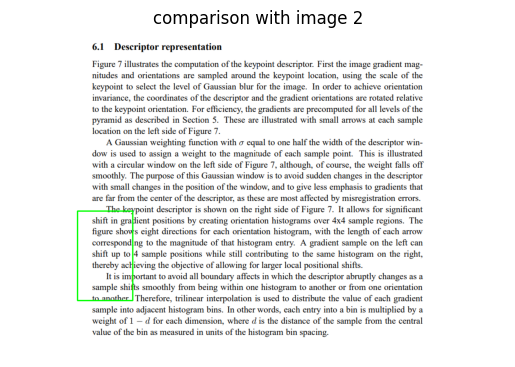

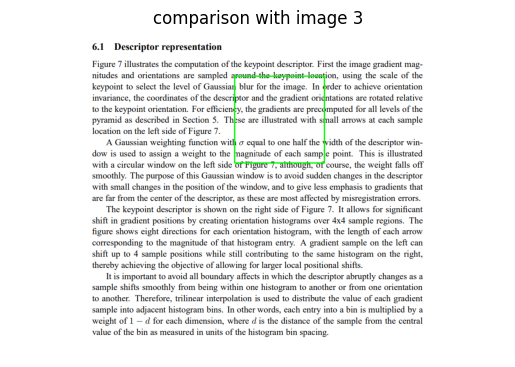

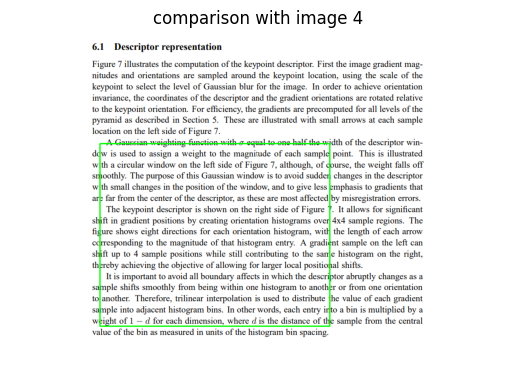

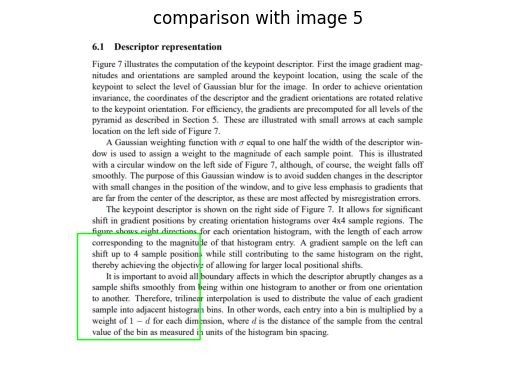

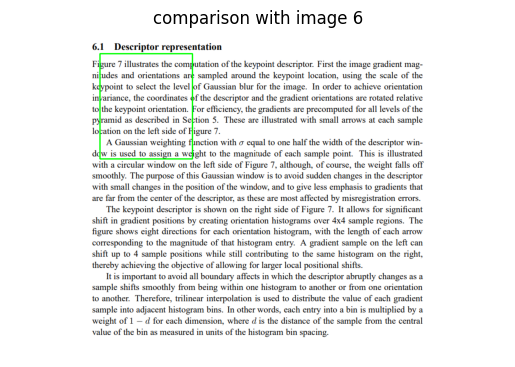

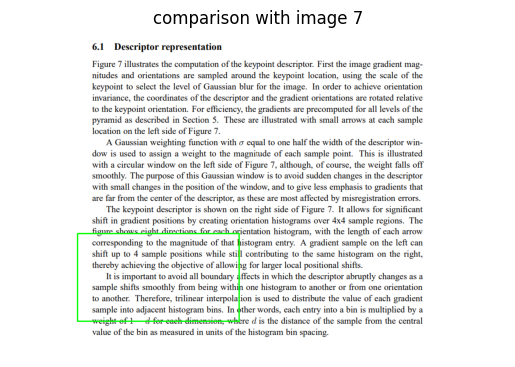

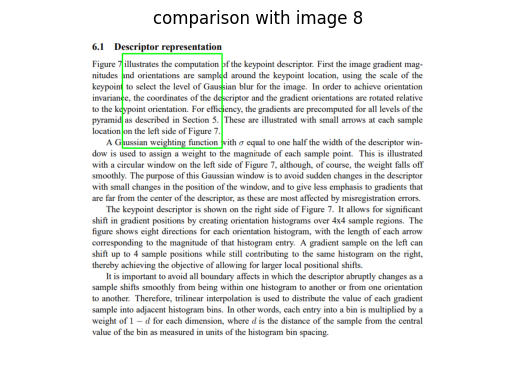

In [ ]:
detect_objects_hog(original_img, cropped_images)

Advantages of SIFT over HOG:

SIFT is constant to scale and rotation but HOG is not constant to limited scale and rotation. SIFT produces highly distinctive descriptors for accurate matching but HOG mostly focuses on edge directions. SIFT is effective for matching across varied conditions but HOG is effective for detection but less robust for feature matching.

**Robustness to image changes:**

SIFT:

Scale: highly robust

Rotation: highly robust

Illumination: moderately robust

Affine Transformations: moderately robust

Noise: robust

***********

HOG:

Scale: less robust.

Rotation: less robust.

Illumination: robust.

Affine Transformations: not robust.

Noise: robust to moderate noise.

# Q4

In [48]:
import os
import random
import pandas as pd
from PIL import Image, ImageDraw
import torch
from torch.utils.data import Dataset
import matplotlib.pyplot as plt
import torchvision.transforms as T

In [47]:
class ObjectDetectionDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_files = [f for f in os.listdir(root_dir) if f.endswith('.jpg')]

        #dictionary to store the bounding box file paths or None if missing
        self.bbox_files = {}
        for img_name in self.image_files:
            bbox_file = img_name.replace('.jpg', '.bboxes.tsv')
            bbox_path = os.path.join(root_dir, bbox_file)
            if os.path.exists(bbox_path):
                self.bbox_files[img_name] = bbox_path
            else:
                self.bbox_files[img_name] = None

        #filter out images without bounding boxes
        self.image_files = [img for img in self.image_files if self.bbox_files[img] is not None]

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_name = self.image_files[idx]
        img_path = os.path.join(self.root_dir, img_name)
        image = Image.open(img_path).convert("RGB")

        bbox_path = self.bbox_files[img_name]


        boxes = []

        if bbox_path is not None:
            df = pd.read_csv(bbox_path, sep='\t', header=None)

            for _, row in df.iterrows():
                xmin, ymin, xmax, ymax = row
                boxes.append([xmin, ymin, xmax, ymax])


        boxes = torch.tensor(boxes, dtype=torch.float32)


        labels = torch.ones((len(boxes),), dtype=torch.int64)

        target = {'boxes': boxes, 'labels': labels}

        if self.transform:
            image = self.transform(image)

        return image, target

    def plot_samples(self, num_samples=5):
        """Randomly select and plot samples with their bounding boxes."""
        samples = random.sample(range(len(self)), num_samples)

        for idx in samples:
            image, target = self[idx]
            self._plot_image_with_boxes(image, target['boxes'])

    def plot_image(self, idx):
        """Plot a single image with its bounding boxes."""
        image, target = self[idx]
        self._plot_image_with_boxes(image, target['boxes'])

    def _plot_image_with_boxes(self, image, boxes):

        if isinstance(image, torch.Tensor):
            image = T.ToPILImage()(image)


        plt.figure(figsize=(8, 8))
        plt.imshow(image)


        draw = ImageDraw.Draw(image)
        for box in boxes:
            draw.rectangle(box.tolist(), outline="red", width=2)

        plt.imshow(image)
        plt.axis('off')
        plt.show()

In [ ]:
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR

transform = T.Compose([T.ToTensor()])

#dataset
dataset = ObjectDetectionDataset(root_dir="/content/content/MyDrive/assignment2 - computer vision - images/drones_dataset/train/", transform=transform)
dataset_validation = ObjectDetectionDataset(root_dir="/content/content/MyDrive/assignment2 - computer vision - images/drones_dataset/validation/", transform=transform)


data_loader = torch.utils.data.DataLoader(dataset, batch_size=2, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))
data_loader_validation = torch.utils.data.DataLoader(dataset_validation, batch_size=2, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')


model.to(device)


params = [p for p in model.parameters() if p.requires_grad]
optimizer = optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)

lr_scheduler = StepLR(optimizer, step_size=3, gamma=0.1)

num_epochs = 10

for epoch in range(num_epochs):
    model.train()
    epoch_loss = 0
    for images, targets in data_loader:
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]


        if any(len(t['boxes']) == 0 for t in targets):
            continue


        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        epoch_loss += losses.item()


        optimizer.zero_grad()
        losses.backward()
        optimizer.step()


    lr_scheduler.step()


    print(f"Epoch #{epoch+1} loss: {epoch_loss/len(data_loader)}")

print("Training complete")